In [97]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns

In [98]:
# Set Display parameters
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)

## Question-01 (Driver Data)

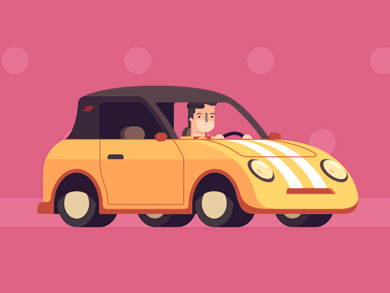

## To make different clusters of the drivers based upon their speed by various methods and compare them

In [99]:
# Read the first dataset
data=pd.read_csv("driver_data.csv",na_values=[""," ","NA","N/A"])

In [100]:
data.head()

,Distance_Feature,Speeding_Feature
0,71.240,28
1,52.530,25
2,64.540,27
3,55.690,22
4,54.580,25


### Data Dictionary
 For each driver, we have two features: 
 1. mean distance driven per day
 2. mean % of time a driver was >5 mph over the speed limit.

In [101]:
data.shape

(4000, 2)

In [102]:
# lower the case of column names 
data.columns = map(str.lower, data.columns)  
print(list(data.columns))

['distance_feature', 'speeding_feature']


In [103]:
list(data.columns)

['distance_feature', 'speeding_feature']

In [104]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   distance_feature  4000 non-null   float64
 1   speeding_feature  4000 non-null   int64  
dtypes: float64(1), int64(1)
memory usage: 62.6 KB


In [105]:
print(data.isnull().sum())
print('')
print(data.isnull().sum().sum())  

distance_feature    0
speeding_feature    0
dtype: int64

0


In [106]:
### Get Descriptive statistics for clustering data
data.describe()  

,distance_feature,speeding_feature
count,4000.000,4000.000
mean,76.042,10.721
std,53.470,13.709
min,15.520,0.000
25%,45.248,4.000
50%,53.330,6.000
75%,65.632,9.000
max,244.790,100.000


- Range of mean distance travelled per day by driver is 15-244 miles
- Avg. of (% times driver exceeded speed limit by 5 miles) is 10%

In [107]:
# Make a copy of original data
datac=data.copy()
datac.shape

(4000, 2)

## Cluster Analysis using KMeans Algorithm

In [108]:
#Apply feature scaling by standardizing the data variables   

from sklearn.preprocessing import StandardScaler

In [109]:
std_scale = StandardScaler().fit(datac)

In [110]:
datac_scaled = std_scale.transform(datac)

In [111]:
datac_scaled[:5,] # first 5 rows   

array([[-0.0898104 ,  1.26061251],
       [-0.43977285,  1.04174351],
       [-0.215131  ,  1.18765617],
       [-0.38066642,  0.8228745 ],
       [-0.40142849,  1.04174351]])

In [112]:
cols = ['distance_feature', 'speeding_feature']  # update your column names 
datac_scaled_df= pd.DataFrame(datac_scaled, columns=cols)
print(datac_scaled_df.head())

   distance_feature  speeding_feature
0            -0.090             1.261
1            -0.440             1.042
2            -0.215             1.188
3            -0.381             0.823
4            -0.401             1.042


In [17]:
# Summarize Scaled dataset 
pd.set_option('display.float_format', lambda x: '%.3f' % x)
datac_scaled_df.describe()

,distance_feature,speeding_feature
count,4000.000,4000.000
mean,-0.000,0.000
std,1.000,1.000
min,-1.132,-0.782
25%,-0.576,-0.490
50%,-0.425,-0.344
75%,-0.195,-0.126
max,3.156,6.513


In [18]:
datac_scaled_df.shape

(4000, 2)

In [19]:
datac_scaled_df.head()

,distance_feature,speeding_feature
0,-0.090,1.261
1,-0.440,1.042
2,-0.215,1.188
3,-0.381,0.823
4,-0.401,1.042


In [20]:
data2=datac_scaled_df.copy()

In [21]:
# Perform K-Means Clustering from SKLearn library
from sklearn.cluster import KMeans

##### Run multiple iteration of KMeans algorithm to find an optimal number of clusters using elbow method.

#### Generate Scree plot

In [22]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

In [23]:
# Get WCSS (Inertia) for each cluster (ranging from 1 to 20) 

# Inertia is the Within cluster sum of squares (distance between point and centroid in a cluster

ssq = []

for K in range(1,20):
    kmeans_model = KMeans(n_clusters=K, random_state=123)
    kmeans_model.fit(data2)
    ssq.append(kmeans_model.inertia_)

In [24]:
# Get Silhoutte Score for K-Means clustering 
range_n_clusters = [2, 3, 4, 5, 6,7,8,9,10]
elbow = []
ss = []
  
for n_clusters in range_n_clusters:
    
    #iterating through cluster sizes
    clusterer = KMeans(n_clusters = n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(data2)
    
    #Finding the average silhouette score
    silhouette_avg = silhouette_score(data2, cluster_labels)
    ss.append(silhouette_avg)
    print("For n_clusters =", n_clusters,"The average silhouette_score is :", silhouette_avg)
    
    #Finding the average SSE"
    SSE = clusterer.inertia_
    elbow.append(clusterer.inertia_) # Inertia: Sum of distances of samples to their closest cluster center
    print("For n_clusters =", n_clusters,"The SSE is :", SSE)

For n_clusters = 2 The average silhouette_score is : 0.7075955632562002
For n_clusters = 2 The SSE is : 3911.9263904284117
For n_clusters = 3 The average silhouette_score is : 0.7636008195603978
For n_clusters = 3 The SSE is : 1756.5445821314256
For n_clusters = 4 The average silhouette_score is : 0.7843727073779272
For n_clusters = 4 The SSE is : 739.1534508645556
For n_clusters = 5 The average silhouette_score is : 0.7410798455080202
For n_clusters = 5 The SSE is : 620.544275710422
For n_clusters = 6 The average silhouette_score is : 0.7338749612229495
For n_clusters = 6 The SSE is : 502.1189726386456
For n_clusters = 7 The average silhouette_score is : 0.4263961647703667
For n_clusters = 7 The SSE is : 438.5767497851817
For n_clusters = 8 The average silhouette_score is : 0.35870886679592107
For n_clusters = 8 The SSE is : 375.61930331278114
For n_clusters = 9 The average silhouette_score is : 0.36094888743709613
For n_clusters = 9 The SSE is : 337.2214045907683
For n_clusters = 10 

###### <font color=red> <b><u><i> 
 -  <b><i><font color=red>SSE should be minimum and Silhoutte score should be maximum for the effective clustering process.</font> </b> </i> 
 - <b><i><font color=red>The SSE for n=5 is quite low than for n=4 and the silhouette score does not show much variance.   </font> </b> </i>  

#### So, we shall run the clustering for n=5.

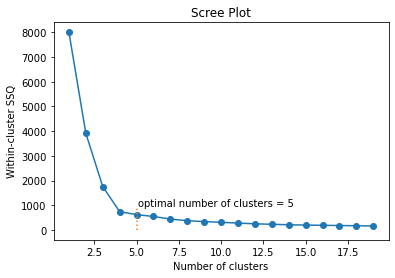

In [25]:
# Plot Scree (Elbow chart) to find optimal no of clusters
plt.plot(range(1,20), ssq, marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("Within-cluster SSQ")
plt.title("Scree Plot")
plt.plot([5]*950, range(1,951), ":")
plt.text(5.1, 951, "optimal number of clusters = 5")
plt.show()

###### <font color=red> <b><u><i> 
 -  <b><i><font color=red>From the SCREE plot also, we can see that 5 should be the optimal number of clusters for the given data.</font> </b> </i> 

###### <font color=red> <b><u><i> Optimal K interpretation:-
  - <i><font color=red> The scree-plot bends at pt 5, which shows it to be the most optimal point</font> </i>
  - <i><font color=red> As the number of clusters increases, the variance (within-group sum of squares) decreases </font> </i> 
  - <i><font color=red> The elbow at five clusters represents the most parsimonious balance between mini- mizing the number of clusters and minimizing the variance within each cluster </font> </i>
  - <i><font color=red> The ideal plot will have an elbow where the quality measure improves more slowly as the number of clusters increases. This indicates that the quality of the model is no longer improving substantially as the model complexity (i.e. number of clusters) increases. In other words, the elbow indicates the number of clusters inherent in the data </font> </i> 
    </i></u></b> </font>

#### Let's fit the KMeans model again with K=5

In [26]:
km = KMeans(n_clusters=5, random_state=123)

In [27]:
km.fit(data2)

KMeans(n_clusters=5, random_state=123)

Make predictions for the clusters of the given dataset

In [28]:
predicted_cluster = km.predict(data2)

In [29]:
predicted_cluster[:5]

array([4, 4, 4, 4, 4])

In [30]:
data2.shape

(4000, 2)

In [31]:
# Convert dataframe to numpy array
data2=data2.to_numpy()

In [32]:
type(data2)

numpy.ndarray

In [33]:
data2

array([[-0.0898104 ,  1.26061251],
       [-0.43977285,  1.04174351],
       [-0.215131  ,  1.18765617],
       ...,
       [ 1.77447381,  0.09331115],
       [ 1.87229869, -0.41738319],
       [ 1.72060465, -0.12555785]])

##### Plot the data partitioned into clusters.

In [34]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,10)

##### Keeping both datasets in numpy array format

## Clusters Plot for K-Means Clustering

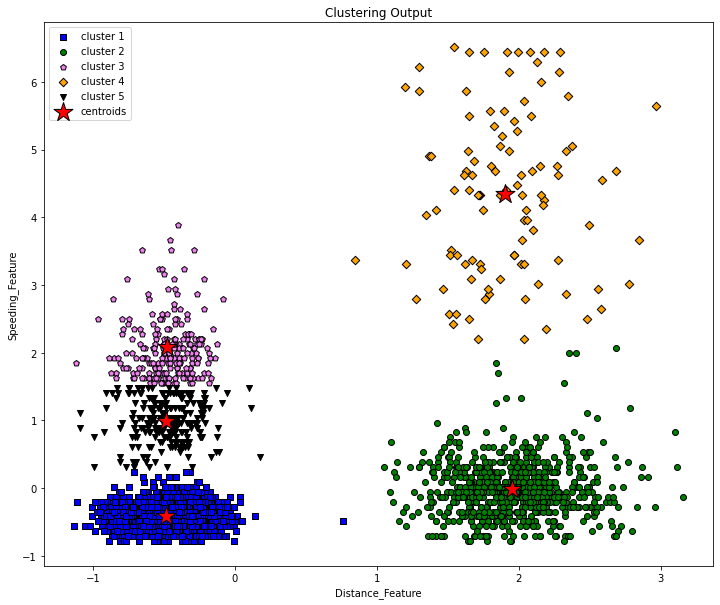

In [35]:
### Plotting 5 optimal clusters obtained from K-Means against two features (second argument is feature number)
### s is marker size  
plt.scatter(data2[predicted_cluster==0,0], data2[predicted_cluster==0,1], c='blue',\
           marker='s', edgecolors='black', label='cluster 1')
plt.scatter(data2[predicted_cluster==1,0], data2[predicted_cluster==1,1], c='green',\
           marker='o', edgecolors='black', label='cluster 2')
plt.scatter(data2[predicted_cluster==2,0], data2[predicted_cluster==2,1], c='violet',\
           marker='p', edgecolors='black', label='cluster 3')
plt.scatter(data2[predicted_cluster==3,0], data2[predicted_cluster==3,1], c='orange',\
           marker='D', edgecolors='black', label='cluster 4')
plt.scatter(data2[predicted_cluster==4,0], data2[predicted_cluster==4,1], c='black',\
           marker='v', edgecolors='black', label='cluster 5')

plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:,1], c='red',\
           marker='*', edgecolors='black', s=400,label='centroids')
plt.legend(scatterpoints=1)
plt.xlabel("Distance_Feature")
plt.ylabel("Speeding_Feature")
plt.title("Clustering Output")
plt.show()

###### <font color=red> <b><u><i> Optimal K interpretation:-
  - <i><font color=blue> Cluster-1(blue): Group of drivers are long distance travellers and follow speed limit restrictions</font> </i>
  - <i><font color=green> Cluster-2(green): Group of drivers are short distance travellers and are least prone to go over speed limit restrictions </font> </i> 
  - <i><font color=violet> Cluster-3(violet): Group of drivers are short distance travellers and are moderately prone to go over speed limit restrictions </font> </i>
  - <i><font color=orange> Cluster-4(orange): Group of drivers are short distance travellers and are highly prone to go over speed limit restrictions </font> </i> 
  - <i><font color=black>  Cluster-5(black): Group of drivers are long distance travellers and are highly prone to go over speed limit restrictions</font> </i> 
    </i></u></b> </font>

###### <font color=red>Insights from the clusters <b><u><i> 
 -  <b><i><font color=red>Cluster 4,5: Speed limit violators</font> </b> </i> 
 -  <b><i><font color=red>Cluster 1: Rule Followers</font> </b> </i> 
 -  <b><i><font color=red>Cluster 2,3: Moderate rule followers</font> </b> </i> 

In [36]:
# Calculate Silhouette score for K-Means clustering (clusters=5)
silhouette_score(data2, km.labels_)

0.7341393562942123

In [37]:
# We can insert these labels back into our dataset.
predictions_relabelled = np.where(predicted_cluster==0, "Rule followers", np.where(predicted_cluster==1,\
                                                                                    "Rule Followers", "Speed Violators"))
datac['category'] = pd.Series(predictions_relabelled, index=datac.index)
datac.index.name = "Customer Number"

In [38]:
pd.DataFrame(datac).head()

,distance_feature,speeding_feature,category
Customer Number,,,
0,71.240,28,Speed Violators
1,52.530,25,Speed Violators
2,64.540,27,Speed Violators
3,55.690,22,Speed Violators
4,54.580,25,Speed Violators


In [39]:
# Saving the new cluster based file to the same directory
datac.to_csv("driving_speed_data.csv", index=False)

## Hierarchical Clustering using Scikit-Learn

In [40]:
from sklearn.preprocessing import StandardScaler

In [41]:
datac1=data.copy()

In [42]:
# scale the dataset
std_scale = StandardScaler().fit(datac1)

In [43]:
datac1_scaled = std_scale.transform(datac1)

In [44]:
datac1_scaled[:5,]

array([[-0.0898104 ,  1.26061251],
       [-0.43977285,  1.04174351],
       [-0.215131  ,  1.18765617],
       [-0.38066642,  0.8228745 ],
       [-0.40142849,  1.04174351]])

###### <font color=red> <b><u><i> 
 -  <b><i><font color=red>In hierarchical clustering, this new step also consists of finding the optimal number of clusters.</font> </b> </i> 
 -  <b><i><font color=red> We are going to use the dendrogram here for prediction of optimum number of clusters</font> </b> </i> 

In [45]:
# Using Scipy we will first create dendrogram for this dataset
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
%matplotlib inline

In [46]:
# Make dendogram black
from scipy.cluster.hierarchy import set_link_color_palette
set_link_color_palette(['green'])

In [47]:
### Perform hierarchical clustering  
link = linkage(datac1_scaled, method='ward', metric='euclidean')

 <b><i><font color=black>Ward method is actually a method that tries to minimize the variance within each cluster. </font> </b> </i> 


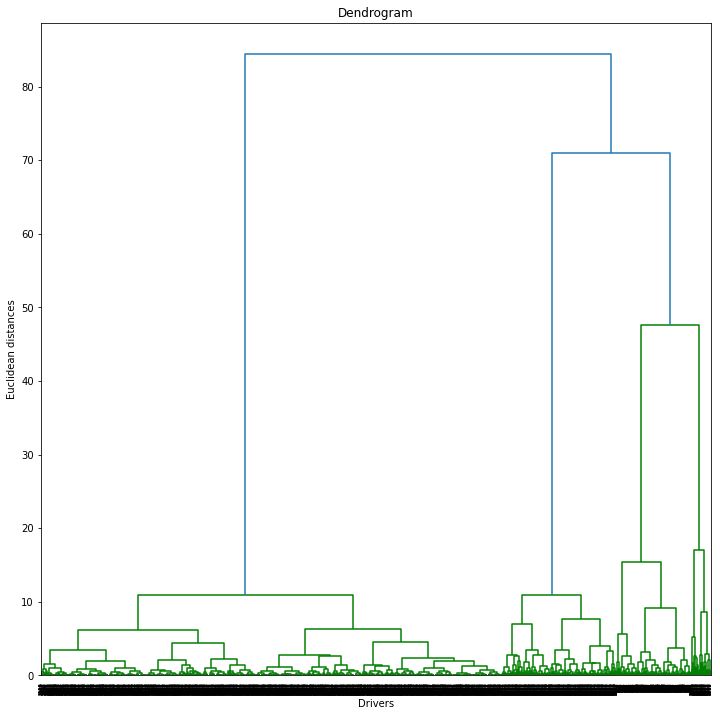

In [48]:
### Draw Dendrograms
plt.figure(figsize=(12,12))
dnd = dendrogram(link)
plt.ylabel("Euclidean distance")

plt.title('Dendrogram')
plt.xlabel('Drivers')
plt.ylabel('Euclidean distances')
plt.show()
# 6 min

###### <font color=red>Choose optimal no of clusters through dendrogram <b><u><i> 
 -  <b><i><font color=red>In hierarchical clustering, this new step also consists of finding the optimal number of clusters.</font> </b> </i> 
 -  <b><i><font color=red> As a rule of thumb, look for the clusters with the longest ‘branches’, the shorter they are, the more similar they are to following ‘twigs’ and ‘leaves’</font> </b> </i> 
 -  <b><i><font color=red>Usually, we choose the cut-off point that cut the tallest vertical line</font> </b> </i> 
 -  <b><i><font color=red>The number of intersections with the vertical line made by the horizontal line would yield the number of the cluster</font> </b> </i> 
 -  <b><i><font color=red>In our case, we can consider 4-6 clusters as most optimal clusters</font> </b> </i> 

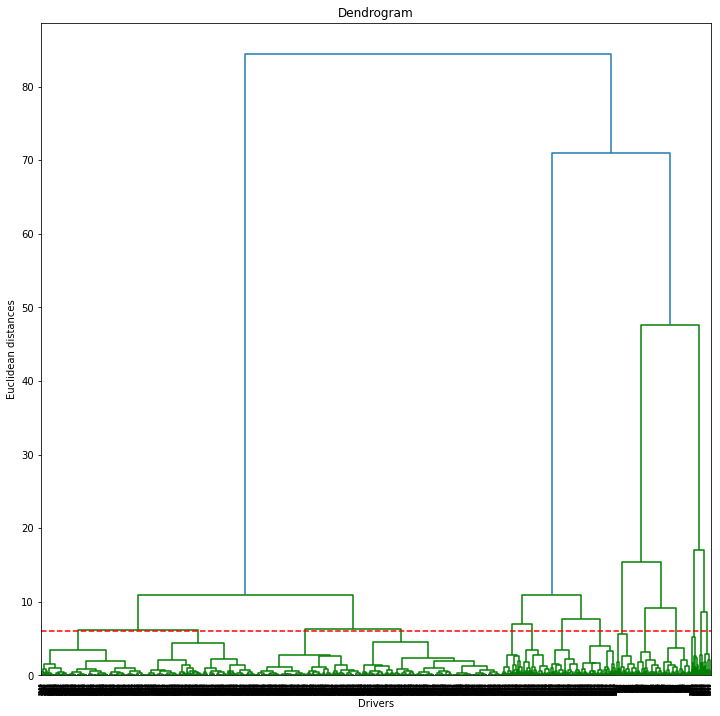

In [49]:
plt.figure(figsize=(12,12))
dnd = dendrogram(link)
plt.ylabel("Euclidean distance")

plt.title('Dendrogram')
plt.xlabel('Drivers')
plt.ylabel('Euclidean distances')
plt.axhline(y=6, color='r', linestyle='--')
plt.show()

# Execution time: 6 min  

###### <font color=red>How to calculate number of optimum clusters in dendrogram: - <b><u><i> 
 -  <b><i><font color=red> We look for the largest distance that we can vertically without crossing any horizontal line and this one is the red framed line on the above diagram.</font> </b> </i> 
 -  <b><i><font color=red>Let's count the number of lines on the diagram and determine the optimal number of clusters.</font> </b> </i> 
 -  <b><i><font color=red> Cluster number will be 6 for this dataset.</font> </b> </i> 
 -  <b><i><font color=red>We can also verify if this number of cuts are numerically a good choice by calculating and comparing Silhouette score for different cluster values.</font> </b> </i> 
 -  <b><i><font color=red>For more info, I reffered to this link- https://nlp.stanford.edu/IR-book/html/htmledition/hierarchical-agglomerative-clustering-1.html</font> </b> </i> 

### Hierarchical clustering algorithms group similar objects into groups called clusters. There are two types of hierarchical clustering algorithms: Agglomerative and Divisive

## Agglomerative Clustering

In [50]:
from sklearn.cluster import AgglomerativeClustering

In [51]:
### fit 5 clusters in agglomerative clustering
model = AgglomerativeClustering(n_clusters=5,affinity = 'euclidean', linkage ='ward')

#### linkage{“ward”, “complete”, “average”, “single”}, default=”ward”

- Which linkage criterion to use. The linkage criterion determines which distance to use between sets of observation. 
- The algorithm will merge the pairs of cluster that minimize this criterion.
- Ward minimizes the variance of the clusters being merged. 
- Average uses the average of the distances of each observation of the two sets
- complete or maximum linkage uses the maximum distances between all observations of the two sets.
- single uses the minimum of the distances between all observations of the two sets.

Referred to https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html

In [52]:
# Fit the model to our scaled dataset
model.fit(datac1_scaled)

AgglomerativeClustering(n_clusters=5)

In [53]:
# Check out the cluster predictions made by the model for our dataset.
model.labels_

array([0, 0, 0, ..., 2, 2, 2], dtype=int64)

In [54]:
from sklearn import metrics
metrics.calinski_harabasz_score(datac1_scaled, model.labels_)

11473.27097955433

In [55]:
# Calculate the Silhouette score for hierrchical clustering (for K=5 Optimal clusters)
from sklearn.metrics import silhouette_score
silhouette_score(datac1_scaled, model.labels_)

0.7762594607264451

In [56]:
# Calculate the Silhouette score using Scikit-Learn's metrics class.
# Silhoutte score for Hierarchical (Agglomerative) clustering 
for i in range(2,10):
    model = AgglomerativeClustering(n_clusters=i).fit(datac1_scaled)
    labels=model.labels_
    labels=model.labels_
    print(i,silhouette_score(datac1_scaled,labels))

2 0.6422495198401666
3 0.7573076255215898
4 0.778897040913367
5 0.7762594607264451
6 0.7443058437156989
7 0.4097498904500179
8 0.34103659847510187
9 0.33906080564120666


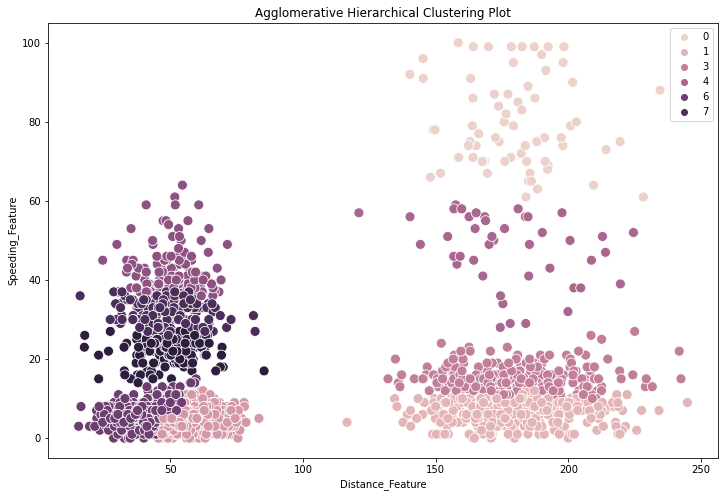

In [57]:
# Let's visualize the cluster output.
plt.figure(figsize=(12,8))
sns.scatterplot(x='distance_feature', y='speeding_feature', data=datac1, hue=model.labels_, s=100)
plt.xlabel("Distance_Feature")
plt.ylabel("Speeding_Feature")
plt.title("Agglomerative Hierarchical Clustering Plot")
plt.show()

#### From the output, we see that a driver falls into one of 5 clusters based on his/her speeding feature and distance feature 

###### <font color=red>Business Insights from Agglomerative Clustering Results:- <b><u><i> 
 -  <b><i><font color=red> Cluster-1(cream): Group of drivers are short distance travellers and moderate to high prone to go over speed limit restrictions</font> </b> </i> 
 -  <b><i><font color=red> Cluster-2(dark cream): Group of drivers are short distance travellers and are least prone to go over speed limit restrictions </font> </b> </i> 
- <b><i><font color=red> Cluster-3(purple): Group of drivers are long distance travellers and least prone to go over speed limit restrictions </font> </b> </i> 
- <b><i><font color=red> Cluster-4(black): Group of drivers are long distance travellers and moderately prone to go over speed limit restrictions</font> </b> </i> 
- <b><i><font color=red> Cluster-5(dark-purple): Group of drivers are long distance travellers and are highly prone to go over speed limit restrictions</font> </b> </i> 

#### Accordingly, an analyst may conclude following labels for each cluster:
- Cluster 4,5: High Distance Speed limit violators
- Cluster 1: Low Distance speed limit violators
- Cluster 2,3: Rule followers

## Comparison based on Silhoutte Score (K-Means vs Hierarchical Clustering Models)

In [58]:
# Calculate Silhouette score for K-Means clustering (clusters=5)
silhouette_score(data2, km.labels_)

0.7341393562942123

In [59]:
# Calculate the Silhouette score for hierrchical clustering (for K=5 Optimal clusters)
from sklearn.metrics import silhouette_score
silhouette_score(datac1_scaled, model.labels_)

0.33906080564120666

<b>Compare the results from your K-Means model and your Hierarchical clustering model using silhouette scores. </b>
- The value of the silhouette score range lies between -1 to 1.
- A score closer to 1 indicates that the data point is very similar to other data points in the cluster,
- A score closer to -1 indicates that the data point is not similar to the data points in its cluster.

<b>Which model is superior? (based on Silhoutte score)?</b>
- Silhoutte score for K-Means is 0.73 and that for Hierarchical is 0.77
- We are getting better silhoutte score in case of Hierarchical clustering
- ### So, Hierarchical clustering model is better than K-Means clustering based on Silhoutte score

# Question 2 (Optional): Company Stocks

In [60]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

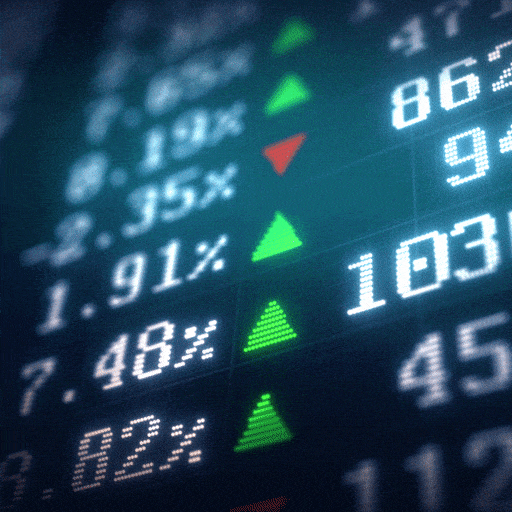

## Partition Companies based upon their Stock Values into clusters

In [61]:
# Pull data for historical stock price movement for 39 companies
data1=pd.read_csv("company_stocks.csv",na_values=[""," ","NA","N/A"])

In [62]:
data1.head() # trading day and company 

,Unnamed: 0,2010-01-04,2010-01-05,2010-01-06,2010-01-07,2010-01-08,2010-01-11,2010-01-12,2010-01-13,2010-01-14,2010-01-15,2010-01-19,2010-01-20,2010-01-21,2010-01-22,2010-01-25,2010-01-26,2010-01-27,2010-01-28,2010-01-29,2010-02-01,2010-02-02,2010-02-03,2010-02-04,2010-02-05,2010-02-08,2010-02-09,2010-02-10,2010-02-11,2010-02-12,2010-02-16,2010-02-17,2010-02-18,2010-02-19,2010-02-22,2010-02-23,2010-02-24,2010-02-25,2010-02-26,2010-03-01,2010-03-02,2010-03-03,2010-03-04,2010-03-05,2010-03-08,2010-03-09,2010-03-10,2010-03-11,2010-03-12,2010-03-15,2010-03-16,2010-03-17,2010-03-18,2010-03-19,2010-03-22,2010-03-23,2010-03-24,2010-03-25,2010-03-26,2010-03-29,2010-03-30,2010-03-31,2010-04-01,2010-04-05,2010-04-06,2010-04-07,2010-04-08,2010-04-09,2010-04-12,2010-04-13,2010-04-14,2010-04-15,2010-04-16,2010-04-19,2010-04-20,2010-04-21,2010-04-22,2010-04-23,2010-04-26,2010-04-27,2010-04-28,2010-04-29,2010-04-30,2010-05-03,2010-05-04,2010-05-05,2010-05-06,2010-05-07,2010-05-10,2010-05-11,2010-05-12,2010-05-13,2010-05-14,2010-05-17,2010-05-18,2010-05-19,2010-05-20,2010-05-21,2010-05-24,2010-05-25,2010-05-26,2010-05-27,2010-05-28,2010-06-01,2010-06-02,2010-06-03,2010-06-04,2010-06-07,2010-06-08,2010-06-09,2010-06-10,2010-06-11,2010-06-14,2010-06-15,2010-06-16,2010-06-17,2010-06-18,2010-06-21,2010-06-22,2010-06-23,2010-06-24,2010-06-25,2010-06-28,2010-06-29,2010-06-30,2010-07-01,2010-07-02,2010-07-06,2010-07-07,2010-07-08,2010-07-09,2010-07-12,2010-07-13,2010-07-14,2010-07-15,2010-07-16,2010-07-19,2010-07-20,2010-07-21,2010-07-22,2010-07-23,2010-07-26,2010-07-27,2010-07-28,2010-07-29,2010-07-30,2010-08-02,2010-08-03,2010-08-04,2010-08-05,2010-08-06,2010-08-09,2010-08-10,2010-08-11,2010-08-12,2010-08-13,2010-08-16,2010-08-17,2010-08-18,2010-08-19,2010-08-20,2010-08-23,2010-08-24,2010-08-25,2010-08-26,2010-08-27,2010-08-30,2010-08-31,2010-09-01,2010-09-02,2010-09-03,2010-09-07,2010-09-08,2010-09-09,2010-09-10,2010-09-13,2010-09-14,2010-09-15,2010-09-16,2010-09-17,2010-09-20,2010-09-21,2010-09-22,2010-09-23,2010-09-24,2010-09-27,2010-09-28,2010-09-29,2010-09-30,2010-10-01,2010-10-04,2010-10-05,2010-10-06,2010-10-07,2010-10-08,2010-10-11,2010-10-12,2010-10-13,2010-10-14,2010-10-15,2010-10-18,2010-10-19,2010-10-20,2010-10-21,2010-10-22,2010-10-25,2010-10-26,2010-10-27,2010-10-28,2010-10-29,2010-11-01,2010-11-02,2010-11-03,2010-11-04,2010-11-05,2010-11-08,2010-11-09,2010-11-10,2010-11-11,2010-11-12,2010-11-15,2010-11-16,2010-11-17,2010-11-18,2010-11-19,2010-11-22,2010-11-23,2010-11-24,2010-11-26,2010-11-29,2010-11-30,2010-12-01,2010-12-02,2010-12-03,2010-12-06,2010-12-07,2010-12-08,2010-12-09,2010-12-10,2010-12-13,2010-12-14,2010-12-15,2010-12-16,2010-12-17,2010-12-20,2010-12-21,2010-12-22,2010-12-23,2010-12-27,2010-12-28,2010-12-29,2010-12-30,2010-12-31,2011-01-03,2011-01-04,2011-01-05,2011-01-06,2011-01-07,2011-01-10,2011-01-11,2011-01-12,2011-01-13,2011-01-14,2011-01-18,2011-01-19,2011-01-20,2011-01-21,2011-01-24,2011-01-25,2011-01-26,2011-01-27,2011-01-28,2011-01-31,2011-02-01,2011-02-02,2011-02-03,2011-02-04,2011-02-07,2011-02-08,2011-02-09,2011-02-10,2011-02-11,2011-02-14,2011-02-15,2011-02-16,2011-02-17,2011-02-18,2011-02-22,2011-02-23,2011-02-24,2011-02-25,2011-02-28,2011-03-01,2011-03-02,2011-03-03,2011-03-04,2011-03-07,2011-03-08,2011-03-09,2011-03-10,2011-03-11,2011-03-14,2011-03-15,2011-03-16,2011-03-17,2011-03-18,2011-03-21,2011-03-22,2011-03-23,2011-03-24,2011-03-25,2011-03-28,2011-03-29,2011-03-30,2011-03-31,2011-04-01,2011-04-04,2011-04-05,2011-04-06,2011-04-07,2011-04-08,2011-04-11,2011-04-12,2011-04-13,2011-04-14,2011-04-15,2011-04-18,2011-04-19,2011-04-20,2011-04-21,2011-04-25,2011-04-26,2011-04-27,2011-04-28,2011-04-29,2011-05-02,2011-05-03,2011-05-04,2011-05-05,2011-05-06,2011-05-09,2011-05-10,2011-05-11,2011-05-12,2011-05-13,2011-05-16,2011-05-17,2011-05-18,2011-05-19,2011-05-20,2011-05-23,2011-05-24,2011-05-25,2011-05-26,2011-05-27,2011-05-31,2011-06-01,2011-06-02,2011-06-03,2011-06-06,2011-06-07,2011-06-08,2011-06-09,2011-0

### Data Dictionary:-

- This stock price movement is defined as the difference in dollar amount between the closing and opening prices for each trading day. 
- The data was originally collected from Yahoo Finance for 2010 to 2015 duration. 
- Each column represents a trading day and each row represents a company. 
- Refer to the header and index for details about the trading day and companies.

In [63]:
### Renaming the column having the names of the company
data1.rename(columns={'Unnamed: 0': 'company_name'}, inplace=True)

In [64]:
data1.set_index('company_name', inplace=True)

In [65]:
data1.head()

,2010-01-04,2010-01-05,2010-01-06,2010-01-07,2010-01-08,2010-01-11,2010-01-12,2010-01-13,2010-01-14,2010-01-15,2010-01-19,2010-01-20,2010-01-21,2010-01-22,2010-01-25,2010-01-26,2010-01-27,2010-01-28,2010-01-29,2010-02-01,2010-02-02,2010-02-03,2010-02-04,2010-02-05,2010-02-08,2010-02-09,2010-02-10,2010-02-11,2010-02-12,2010-02-16,2010-02-17,2010-02-18,2010-02-19,2010-02-22,2010-02-23,2010-02-24,2010-02-25,2010-02-26,2010-03-01,2010-03-02,2010-03-03,2010-03-04,2010-03-05,2010-03-08,2010-03-09,2010-03-10,2010-03-11,2010-03-12,2010-03-15,2010-03-16,2010-03-17,2010-03-18,2010-03-19,2010-03-22,2010-03-23,2010-03-24,2010-03-25,2010-03-26,2010-03-29,2010-03-30,2010-03-31,2010-04-01,2010-04-05,2010-04-06,2010-04-07,2010-04-08,2010-04-09,2010-04-12,2010-04-13,2010-04-14,2010-04-15,2010-04-16,2010-04-19,2010-04-20,2010-04-21,2010-04-22,2010-04-23,2010-04-26,2010-04-27,2010-04-28,2010-04-29,2010-04-30,2010-05-03,2010-05-04,2010-05-05,2010-05-06,2010-05-07,2010-05-10,2010-05-11,2010-05-12,2010-05-13,2010-05-14,2010-05-17,2010-05-18,2010-05-19,2010-05-20,2010-05-21,2010-05-24,2010-05-25,2010-05-26,2010-05-27,2010-05-28,2010-06-01,2010-06-02,2010-06-03,2010-06-04,2010-06-07,2010-06-08,2010-06-09,2010-06-10,2010-06-11,2010-06-14,2010-06-15,2010-06-16,2010-06-17,2010-06-18,2010-06-21,2010-06-22,2010-06-23,2010-06-24,2010-06-25,2010-06-28,2010-06-29,2010-06-30,2010-07-01,2010-07-02,2010-07-06,2010-07-07,2010-07-08,2010-07-09,2010-07-12,2010-07-13,2010-07-14,2010-07-15,2010-07-16,2010-07-19,2010-07-20,2010-07-21,2010-07-22,2010-07-23,2010-07-26,2010-07-27,2010-07-28,2010-07-29,2010-07-30,2010-08-02,2010-08-03,2010-08-04,2010-08-05,2010-08-06,2010-08-09,2010-08-10,2010-08-11,2010-08-12,2010-08-13,2010-08-16,2010-08-17,2010-08-18,2010-08-19,2010-08-20,2010-08-23,2010-08-24,2010-08-25,2010-08-26,2010-08-27,2010-08-30,2010-08-31,2010-09-01,2010-09-02,2010-09-03,2010-09-07,2010-09-08,2010-09-09,2010-09-10,2010-09-13,2010-09-14,2010-09-15,2010-09-16,2010-09-17,2010-09-20,2010-09-21,2010-09-22,2010-09-23,2010-09-24,2010-09-27,2010-09-28,2010-09-29,2010-09-30,2010-10-01,2010-10-04,2010-10-05,2010-10-06,2010-10-07,2010-10-08,2010-10-11,2010-10-12,2010-10-13,2010-10-14,2010-10-15,2010-10-18,2010-10-19,2010-10-20,2010-10-21,2010-10-22,2010-10-25,2010-10-26,2010-10-27,2010-10-28,2010-10-29,2010-11-01,2010-11-02,2010-11-03,2010-11-04,2010-11-05,2010-11-08,2010-11-09,2010-11-10,2010-11-11,2010-11-12,2010-11-15,2010-11-16,2010-11-17,2010-11-18,2010-11-19,2010-11-22,2010-11-23,2010-11-24,2010-11-26,2010-11-29,2010-11-30,2010-12-01,2010-12-02,2010-12-03,2010-12-06,2010-12-07,2010-12-08,2010-12-09,2010-12-10,2010-12-13,2010-12-14,2010-12-15,2010-12-16,2010-12-17,2010-12-20,2010-12-21,2010-12-22,2010-12-23,2010-12-27,2010-12-28,2010-12-29,2010-12-30,2010-12-31,2011-01-03,2011-01-04,2011-01-05,2011-01-06,2011-01-07,2011-01-10,2011-01-11,2011-01-12,2011-01-13,2011-01-14,2011-01-18,2011-01-19,2011-01-20,2011-01-21,2011-01-24,2011-01-25,2011-01-26,2011-01-27,2011-01-28,2011-01-31,2011-02-01,2011-02-02,2011-02-03,2011-02-04,2011-02-07,2011-02-08,2011-02-09,2011-02-10,2011-02-11,2011-02-14,2011-02-15,2011-02-16,2011-02-17,2011-02-18,2011-02-22,2011-02-23,2011-02-24,2011-02-25,2011-02-28,2011-03-01,2011-03-02,2011-03-03,2011-03-04,2011-03-07,2011-03-08,2011-03-09,2011-03-10,2011-03-11,2011-03-14,2011-03-15,2011-03-16,2011-03-17,2011-03-18,2011-03-21,2011-03-22,2011-03-23,2011-03-24,2011-03-25,2011-03-28,2011-03-29,2011-03-30,2011-03-31,2011-04-01,2011-04-04,2011-04-05,2011-04-06,2011-04-07,2011-04-08,2011-04-11,2011-04-12,2011-04-13,2011-04-14,2011-04-15,2011-04-18,2011-04-19,2011-04-20,2011-04-21,2011-04-25,2011-04-26,2011-04-27,2011-04-28,2011-04-29,2011-05-02,2011-05-03,2011-05-04,2011-05-05,2011-05-06,2011-05-09,2011-05-10,2011-05-11,2011-05-12,2011-05-13,2011-05-16,2011-05-17,2011-05-18,2011-05-19,2011-05-20,2011-05-23,2011-05-24,2011-05-25,2011-05-26,2011-05-27,2011-05-31,2011-06-01,2011-06-02,2011-06-03,2011-06-06,2011-06-07,2011-06-08,2011-06-09,2011-06-10,2011-0

 <b><i><font color=red> Weekday data from (04Jan2010-29Oct2013) ~ 4 yrs   </font> </b> </i>   

In [66]:
data1.shape

(39, 963)

In [67]:
### Checking data type
data1.dtypes  

2010-01-04    float64
2010-01-05    float64
2010-01-06    float64
2010-01-07    float64
2010-01-08    float64
2010-01-11    float64
2010-01-12    float64
2010-01-13    float64
2010-01-14    float64
2010-01-15    float64
2010-01-19    float64
2010-01-20    float64
2010-01-21    float64
2010-01-22    float64
2010-01-25    float64
2010-01-26    float64
2010-01-27    float64
2010-01-28    float64
2010-01-29    float64
2010-02-01    float64
2010-02-02    float64
2010-02-03    float64
2010-02-04    float64
2010-02-05    float64
2010-02-08    float64
2010-02-09    float64
2010-02-10    float64
2010-02-11    float64
2010-02-12    float64
2010-02-16    float64
2010-02-17    float64
2010-02-18    float64
2010-02-19    float64
2010-02-22    float64
2010-02-23    float64
2010-02-24    float64
2010-02-25    float64
2010-02-26    float64
2010-03-01    float64
2010-03-02    float64
2010-03-03    float64
2010-03-04    float64
2010-03-05    float64
2010-03-08    float64
2010-03-09    float64
2010-03-10

In [68]:
### Checking for any null values
print(data1.isnull().sum().sum())  

0


In [69]:
# Make a copy of original data
data1c=data1.copy()
data1c.shape

(39, 963)

In [70]:
# Standardize the data to have a mean of ~0 and a variance of 1
def normalizedData(x):
    normalised = StandardScaler()
    normalised.fit_transform(x)
    return(x)

data1d = normalizedData(data1c)
X_std=data1d

 <b><i><font color=red> Due to high no of variables, we will have to perform PCA to reduce variables for clustering as it has 963 columns hence we will find the optimal number of components which capture the greatest amount of variance in the data.  </font> </b> </i>   

### PCA analysis for feature selection (dimensionality reduction)

In [71]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(25, 15), dpi=90, facecolor='w', edgecolor='k')

<Figure size 2250x1350 with 0 Axes>

<Figure size 2250x1350 with 0 Axes>

explained variance ratio: [0.21715465 0.09825625 0.0763197  0.06524769 0.0594327  0.04758782
 0.04174789 0.0347802  0.03145693 0.03036051 0.02913045 0.02728689
 0.02626434 0.02224835 0.02005426 0.01981557 0.01841949 0.01756607
 0.01613807 0.01317121]


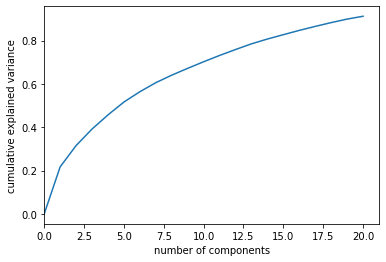

In [72]:
### Explained Variance Plot 
from sklearn.decomposition import PCA

pca1 = PCA(n_components = 20)
pca1.fit_transform(X_std)
print('explained variance ratio: %s'
      % str(pca1.explained_variance_ratio_))
plt.plot(np.r_[[0],np.cumsum(pca1.explained_variance_ratio_)])
plt.xlim(0,21)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

###### <font color=red>Insights from the PCA graph <b><u><i> 
 -  <b><i><font color=red> 50% proportion of the variance is explained, approximately, by the first 4 components according to our graph</font> </b> </i> 
 -  <b><i><font color=red>90% proportion of the variance is explained, approximately, by the first 15 components by looking at the graph</font> </b> </i> 

In [73]:
# Create a PCA instance: pca
from sklearn.decomposition import PCA
pca = PCA(n_components=25,random_state=1234) # selecting top 25 components
principalcomponents = pca.fit_transform(X_std)

Text(0.5, 1.0, 'PCA Plot')

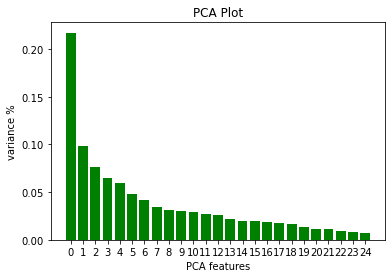

In [74]:
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='green')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
plt.title('PCA Plot')

###### <font color=red> <b><u><i> PCA Plot interpretation:-
  - <i><font color=red> First three components explain the majority of the variance in our data</font> </i>
    </i></u></b> </font>

In [75]:
# Save components to a DataFrame
PCA_components = pd.DataFrame(principalcomponents)

In [76]:
PCA_components.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,3.204,4.800,-5.024,-9.131,15.805,4.694,4.599,2.617,1.753,1.722,1.129,-0.223,0.129,0.386,-0.434,0.944,0.438,0.628,0.317,-0.175,0.084,-0.050,-0.220,0.047,-0.185
1,4.377,-1.701,-1.434,-1.051,3.366,-3.648,-7.651,2.121,-5.533,-2.008,-5.577,2.125,4.293,0.244,1.095,6.470,1.599,-0.041,0.557,-0.498,-0.057,-0.395,-0.144,-0.040,-0.426
2,12.515,-9.579,-10.410,-1.231,-2.889,-10.168,9.066,1.428,-0.674,-1.803,0.401,-0.312,-0.286,0.126,-0.170,-0.049,0.643,-0.107,-0.450,0.024,-0.048,0.044,-0.131,-0.028,-0.221
3,-4.242,2.466,-0.588,-2.033,-0.358,-0.275,-0.074,-0.515,-0.848,-0.872,-1.176,-0.437,-0.325,-0.390,-0.471,-1.118,-0.130,-0.715,-0.383,0.124,0.402,-1.141,-0.514,-0.117,0.089
4,-1.614,1.392,0.476,-0.877,-0.943,-0.809,0.086,-0.403,-0.727,2.239,0.114,0.579,-0.765,0.699,0.929,-0.021,0.773,-0.646,-0.224,0.537,2.266,-1.359,4.574,0.302,-2.139


In [77]:
PCA_components.shape

(39, 25)

In [78]:
pca.explained_variance_ratio_

array([0.21715465, 0.09825625, 0.0763197 , 0.06524769, 0.0594327 ,
       0.04758782, 0.04174789, 0.0347802 , 0.03145693, 0.03036051,
       0.02913045, 0.02728689, 0.02626434, 0.02224835, 0.02005426,
       0.01981557, 0.0184195 , 0.01756607, 0.01613808, 0.01317128,
       0.01172814, 0.01133873, 0.00881968, 0.00782543, 0.0070354 ])

Text(0, 0.5, 'PCA 2')

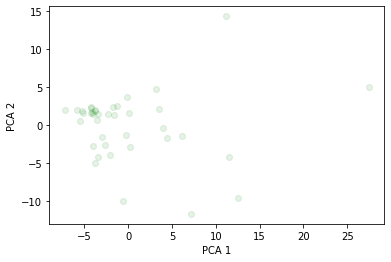

In [79]:
### Plot between first two PCA Components 
plt.scatter(PCA_components[0], PCA_components[1], alpha=.1, color='green')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

###### <font color=red> <b><u><i> PCA Plot interpretation:-
  - <i><font color=red> First three components explain the majority of the variance in our data</font> </i>
    </i></u></b> </font>

C:\Users\Swastik\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


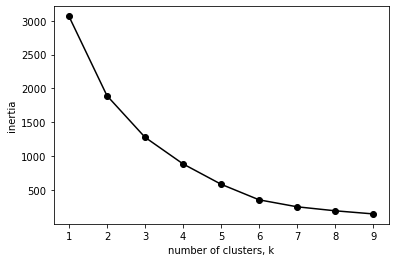

In [80]:
### Fit K-Means clustering on Top-25 PCA Components 

ks = range(1, 10)  
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_components.iloc[:,:3])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

###### <font color=red> <b><u><i> Insights from the graph </i></u></b> </font>
  - <i><font color=red> The Scree plot shows that after 5 clusters at (the elbow), the change in the value of inertia
  is no longer significant and most likely,neither is the variance of the rest of the data 
  after the elbow point.</font> </i>
   - <i><font color=red> Therefore we can discard everything after k=4 and proceed to the last
  step in the process.</font> </i>
    


### Visualizing and Interpreting the Clusters (Applying K-Means & Hierarchical on transformed and reduced data)

#### 1. K-Means Clustering

In [81]:
km = KMeans(n_clusters=3, random_state=123) # create 3 clusters 

In [82]:
# Fit K-Means on top-3 PCA components
km.fit(PCA_components.iloc[:,:3])

KMeans(n_clusters=3, random_state=123)

Make predictions for the clusters of the given dataset

In [83]:
predicted_cluster = km.predict((PCA_components.iloc[:,:3]))

In [84]:
predicted_cluster[:5]

array([1, 1, 1, 0, 0])

In [85]:
PCA_components=PCA_components.to_numpy()

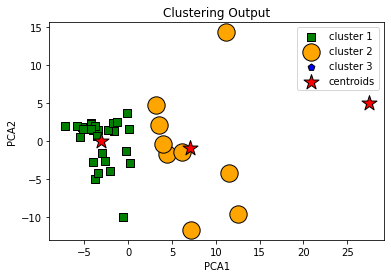

In [86]:
### Plotting 5 optimal clusters obtained from K-Means against two features (second argument is feature number)
### s is marker size  
plt.scatter(PCA_components[predicted_cluster==0,0], PCA_components[predicted_cluster==0,1],s=50, c='green',\
           marker='s', edgecolors='black', label='cluster 1')
plt.scatter(PCA_components[predicted_cluster==1,0], PCA_components[predicted_cluster==1,1],s=300, c='orange',\
           marker='o', edgecolors='black', label='cluster 2')
plt.scatter(PCA_components[predicted_cluster==2,0], PCA_components[predicted_cluster==2,1],s=50, c='blue',\
           marker='p', edgecolors='black', label='cluster 3')

plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:,1], c='red',\
           marker='*', edgecolors='black', s=250,label='centroids')
plt.legend(scatterpoints=1)
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.title("Clustering Output")
plt.show()

###### <font color=red>Insights from the cluster analysis <b><u><i> 
 -  <b><i><font color=orange> CLuster 2 has only 1 point.</font> </b> </i> 
 -  <b><i><font color=orange>Company in cluster 2 with more PCA value has more stock price maintained without a fall. </font> </b> </i> 
 -  <b><i><font color=green>Cluster 1 companies have comparatively more stock price changes frequently. </font> </b> </i> 
 -  <b><i><font color=blue>Cluster 3 companies have seen a variety from the lowest fall in stock price and the highest too. </font> </b> </i> 

In [87]:
range_n_clusters = [2, 3, 4, 5, 6,7,8,9,10]
elbow = []
ss = []
  
for n_clusters in range_n_clusters:
    
    #iterating through cluster sizes
    clusterer = KMeans(n_clusters = n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(PCA_components)
    
    #Finding the average silhouette score
    silhouette_avg = silhouette_score(PCA_components, cluster_labels)
    ss.append(silhouette_avg)
    print("For n_clusters =", n_clusters,"The average silhouette_score is :", silhouette_avg)
    
    #Finding the average SSE"
    SSE = clusterer.inertia_
    elbow.append(clusterer.inertia_) # Inertia: Sum of distances of samples to their closest cluster center
    print("For n_clusters =", n_clusters,"The SSE is :", SSE)

For n_clusters = 2 The average silhouette_score is : 0.3799969709484937
For n_clusters = 2 The SSE is : 6316.844861281994
For n_clusters = 3 The average silhouette_score is : 0.2712002877709096
For n_clusters = 3 The SSE is : 5700.343553820701
For n_clusters = 4 The average silhouette_score is : 0.3580278126913298
For n_clusters = 4 The SSE is : 5112.362049329857
For n_clusters = 5 The average silhouette_score is : 0.19612043607674343
For n_clusters = 5 The SSE is : 4690.771964556835
For n_clusters = 6 The average silhouette_score is : 0.21122596817691622
For n_clusters = 6 The SSE is : 4126.752305219136
For n_clusters = 7 The average silhouette_score is : 0.303834697225957
For n_clusters = 7 The SSE is : 3687.8181995482864
For n_clusters = 8 The average silhouette_score is : 0.20747243279290564
For n_clusters = 8 The SSE is : 3280.7796234793277
For n_clusters = 9 The average silhouette_score is : 0.19820733623392878
For n_clusters = 9 The SSE is : 3046.2165675378883
For n_clusters = 1

###### <font color=red>Silhoutte score for K-Means Clustering results (K=5 is the best):<b><u><i> 
 -  <b><i><font color=red>For n_clusters = 5 The average silhouette_score is : 0.384844607208631</font> </b> </i> 
 -  <b><i><font color=red>For n_clusters = 5 The SSE is : 4663.700454119653 </font> </b> </i> 

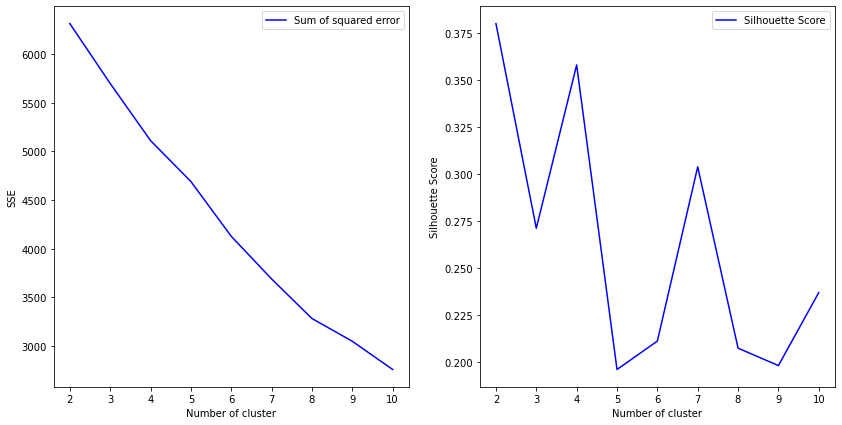

In [88]:
# Plot the graph to visualize the Elbow Method to find the optimal number of clusters  
fig = plt.figure(figsize=(14,7))
fig.add_subplot(121)
plt.plot(range_n_clusters, elbow,'b-',label='Sum of squared error')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.legend()
fig.add_subplot(122)
plt.plot(range_n_clusters, ss,'b-',label='Silhouette Score')
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Score")
plt.legend()
plt.show()  

###### <font color=red><b><u><i> 
 -  <b><i><font color=red>The number of cluster shows the max rise in Silhouette Score for n=5 although with the normal decreasing trend in the SSE values </font> </b> </i> 

In [89]:
for k in range(2,8):
    kmeans_model = KMeans(n_clusters=k, random_state=1).fit(PCA_components)
    labels = kmeans_model.labels_
    labels = kmeans_model.labels_
    print (k, metrics.davies_bouldin_score(PCA_components, labels))   

2 1.4650304629619681
3 1.6642949915428928
4 0.3975055479878993
5 0.9523531382620192
6 0.739613795311954
7 0.7301715702971393


#### 2.Hierarchical Clustering

In [90]:
PCA_components=pd.DataFrame(PCA_components)

In [91]:
PCA_components.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,3.204,4.800,-5.024,-9.131,15.805,4.694,4.599,2.617,1.753,1.722,1.129,-0.223,0.129,0.386,-0.434,0.944,0.438,0.628,0.317,-0.175,0.084,-0.050,-0.220,0.047,-0.185
1,4.377,-1.701,-1.434,-1.051,3.366,-3.648,-7.651,2.121,-5.533,-2.008,-5.577,2.125,4.293,0.244,1.095,6.470,1.599,-0.041,0.557,-0.498,-0.057,-0.395,-0.144,-0.040,-0.426
2,12.515,-9.579,-10.410,-1.231,-2.889,-10.168,9.066,1.428,-0.674,-1.803,0.401,-0.312,-0.286,0.126,-0.170,-0.049,0.643,-0.107,-0.450,0.024,-0.048,0.044,-0.131,-0.028,-0.221
3,-4.242,2.466,-0.588,-2.033,-0.358,-0.275,-0.074,-0.515,-0.848,-0.872,-1.176,-0.437,-0.325,-0.390,-0.471,-1.118,-0.130,-0.715,-0.383,0.124,0.402,-1.141,-0.514,-0.117,0.089
4,-1.614,1.392,0.476,-0.877,-0.943,-0.809,0.086,-0.403,-0.727,2.239,0.114,0.579,-0.765,0.699,0.929,-0.021,0.773,-0.646,-0.224,0.537,2.266,-1.359,4.574,0.302,-2.139


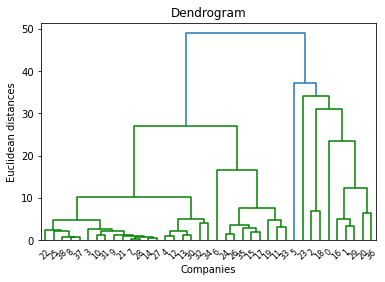

In [92]:
# Using the dendrogram to find the optimal number of clusters
import scipy.cluster.hierarchy as sch

dendrogram = sch.dendrogram(sch.linkage(PCA_components.iloc[:,:5], method = 'ward'))

plt.title('Dendrogram')
plt.xlabel('Companies')
plt.ylabel('Euclidean distances')
plt.show()

###### <font color=red><b><u><i> 
 -  <b><i><font color=red>From dendogram, we are getting 3-5 optimal K clusters on PCA components  </font> </b> </i> 

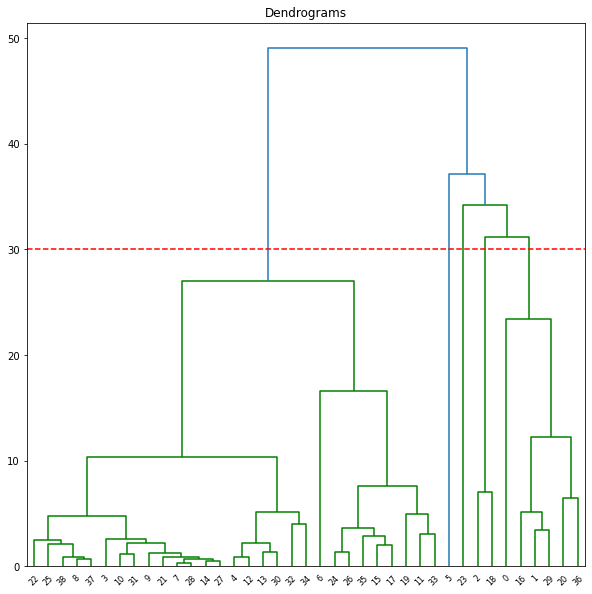

In [93]:
plt.figure(figsize=(10, 10))  
plt.title("Dendrograms")  
dend = sch.dendrogram(sch.linkage(PCA_components.iloc[:,:5], method='ward'))
plt.axhline(y=30,color='r', linestyle='--')

#### By cutting the line also, we get n=5 optimal number of clusters.

In [94]:
# Fitting Hierarchical Clustering to the dataset
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage = 'ward')
y_hc=hc.fit_predict(PCA_components.iloc[:,:5])

In [95]:
# Calculate the Silhouette score for hierrchical clustering (for K=5 Optimal clusters)
from sklearn.metrics import silhouette_score
silhouette_score(PCA_components.iloc[:,:3], y_hc)*100

48.23882187407186

### Silhouette Score

In [96]:
# Silhoutte score for Hierarchical clustering 
for i in range(2,9):
    model = AgglomerativeClustering(n_clusters=i).fit(PCA_components)
    labels=model.labels_
    labels=model.labels_
    print(i,silhouette_score(PCA_components,labels))

2 0.2863609432955219
3 0.2739300199476825
4 0.2644041917847169
5 0.2519791737671033
6 0.2044774066757001
7 0.2124182271491547
8 0.21415851238799186


<font color=red><b>
1.K-Means Clustering Results Summary
- For n_clusters = 5 The average silhouette_score is : 0.38484
- For n_clusters = 5 The SSE is : 4663.700

2.Hierarchical Clustering Results Summary
- For n= 5 The average silhouette_score is : 0.2519


<b><font color=black>Based on these results, most best clusters results were obtained through K-Means clustering as it had more Silhouette Score Values than the hierarchial clustering post PCA & Scaling of variables to n=5 </b>